# Analisis Cuantitativo en Finanzas 2022

## Menu del dia:

    - (1) Web scraping de iol
    - (2) Limpieza y generacion de dataframe ad-hoc para futuros usos
    - (3) algunos plots de market data de opciones
    
    

## (1) Web Scraping de la pagina de IOL

Modulos necesarios

data_byma (en github) ;

utils_opciones_byma (en github)

bs4,

requests,

pandas,

matplotlib,

datetime,

calendar,


Instalarlos con Anaconda, comando Conda o comando pip install

### Importo los modulos

In [2]:
from data_byma import *
from utils_opciones_byma import *



### Metodo para el web scraping

In [3]:
panel_iol = web_scraping_opciones_iol()
panel_iol.head(20)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado
0,ALUC100.AG ...,5.810,6.200,5.800,6.200,5.810,40435.0
1,ALUC100.JU ...,0.816,1.000,0.736,1.000,0.816,0.0
2,ALUC105.AG ...,7.000,7.000,7.000,7.000,7.000,0.0
3,ALUC105.JU ...,0.220,0.400,0.150,0.400,0.220,0.0
4,ALUC110.JU ...,0.650,0.650,0.650,0.650,0.650,0.0
5,ALUC115.AG ...,9.000,9.000,9.000,9.000,9.000,0.0
6,ALUC67.0JU ...,21.490,21.490,21.490,21.490,21.490,0.0
7,ALUC67.0OC ...,37.000,37.000,37.000,37.000,37.000,0.0
8,ALUC69.0JU ...,20.000,20.000,20.000,20.000,20.000,0.0
9,ALUC71.0JU ...,22.269,22.275,21.600,22.275,22.269,426452.0


### Que hace internamente el metodo??

#### Beautiful Soup /requests 


Mas sobre BS4: https://j2logo.com/python/web-scraping-con-python-guia-inicio-beautifulsoup/

Mas sobre requests: https://www.digitalocean.com/community/tutorials/how-to-get-started-with-the-requests-library-in-python-es

In [4]:
from bs4 import BeautifulSoup
import requests
import pandas as pd

#### Como usamos BeautifulSoup y requests

In [5]:
url = 'https://iol.invertironline.com/mercado/cotizaciones/argentina/opciones/todas'

page = requests.get(url)
page

<Response [200]>

In [6]:
# En soup voy a encontrar el codigo html de la pagina

soup = BeautifulSoup(page.text, 'lxml')
soup

<!DOCTYPE html>
<!-- paulirish.com/2008/conditional-stylesheets-vs-css-hacks-answer-neither/ --><!--[if lt IE 7]> <html class="no-js lt-ie9 lt-ie8 lt-ie7" lang="es"> <![endif]--><!--[if IE 7]>    <html class="no-js lt-ie9 lt-ie8" lang="es"> <![endif]--><!--[if IE 8]>    <html class="no-js lt-ie9" lang="es"> <![endif]--><!-- Consider adding a manifest.appcache: h5bp.com/d/Offline --><!--[if gt IE 8]><!--><html class="no-js" lang="es">
<!--<![endif]-->
<head>
<link href="/manifest.json" rel="manifest"/>
<script src="/bundles/Notificaciones?v=nos3x6dneV7Zyj4sDet4Cz2xfCqwf3DRHCvUZmsTHx81"></script>
<script async="" src="https://cdn.onesignal.com/sdks/OneSignalSDK.js"></script>
<script>
        var OneSignal = window.OneSignal || [];
        //InicializarOneSignal("3560fafb-4e99-483c-9b21-2691d01b689f", "", false, "web.onesignal.auto.47a2f439-afd3-4bb7-8cdd-92cc4f5ee46c");

        function lazyOneSignal(){
        	//InicializarOneSignal("3560fafb-4e99-483c-9b21-2691d01b689f", "", false, "

#### El arte del scraping

Aqui es donde uno tiene que meterse en el codigo interno de la pagina e 'identificar' la informacion que necesita. En este caso la tabla de informacion de opciones
Se puede hacer una inspeccion en modo dev del navegador


In [7]:

opciones_html = soup.find('table', {'id': 'cotizaciones'})


opciones_html




<table class="table table-striped theadh36 table-hover fs12 middleContent cotizacionestb row" id="cotizaciones">
<thead>
<tr class="text-center dthead">
<td>Símbolo</td>
<td>Último<br/>Operado</td>
<td>Variación<br/>Diaria</td>
<td>Cantidad<br/>Compra</td>
<td>Precio<br/>Compra</td>
<td>Precio<br/>Venta</td>
<td>Cantidad<br/>Venta</td>
<td>Apertura</td>
<td>Mínimo</td>
<td>Máximo</td>
<td>Último<br/>Cierre</td>
<td>Monto<br/>Operado</td>
<td class="noarrow"></td>
</tr>
</thead>
<tbody>
<tr data-cantidad="1" data-tituloid="111993-">
<td class="tal links neutral mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
<i class="icono-simbolo mr10 fl aigc1800ag" data-placement="top" data-toggle="tooltip"></i>
<a data-placement="top" data-symbol="AIGC1800AG" data-toggle="tooltip" data-url="/Titulo/Index/111993" href="/Titulo/Index/111993">
<b>
                                AIGC1800AG
                            </b>
<br/>
<span style="font-s

#### Aqui continua el detalle. Se identifican las filas de la tabla. *tr* sera el separador que va empezando y cerrando las filas

In [8]:
# Filas ya va ordenando cada una de las opciones


filas = opciones_html.find_all('tr')
filas

[<tr class="text-center dthead">
 <td>Símbolo</td>
 <td>Último<br/>Operado</td>
 <td>Variación<br/>Diaria</td>
 <td>Cantidad<br/>Compra</td>
 <td>Precio<br/>Compra</td>
 <td>Precio<br/>Venta</td>
 <td>Cantidad<br/>Venta</td>
 <td>Apertura</td>
 <td>Mínimo</td>
 <td>Máximo</td>
 <td>Último<br/>Cierre</td>
 <td>Monto<br/>Operado</td>
 <td class="noarrow"></td>
 </tr>,
 <tr data-cantidad="1" data-tituloid="111993-">
 <td class="tal links neutral mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
 <i class="icono-simbolo mr10 fl aigc1800ag" data-placement="top" data-toggle="tooltip"></i>
 <a data-placement="top" data-symbol="AIGC1800AG" data-toggle="tooltip" data-url="/Titulo/Index/111993" href="/Titulo/Index/111993">
 <b>
                                 AIGC1800AG
                             </b>
 <br/>
 <span style="font-size: 11px;">
 </span>
 </a>
 </td>
 <td class="right tar" data-field="UltimoPrecio" data-order="0" data-quotestyl

#### Identifico la primera linea, la de los -headers- de la tabla

In [9]:
tr = filas[0]
tr

<tr class="text-center dthead">
<td>Símbolo</td>
<td>Último<br/>Operado</td>
<td>Variación<br/>Diaria</td>
<td>Cantidad<br/>Compra</td>
<td>Precio<br/>Compra</td>
<td>Precio<br/>Venta</td>
<td>Cantidad<br/>Venta</td>
<td>Apertura</td>
<td>Mínimo</td>
<td>Máximo</td>
<td>Último<br/>Cierre</td>
<td>Monto<br/>Operado</td>
<td class="noarrow"></td>
</tr>

#### Identifico cada columna dentro de la fila con el marcador td


In [10]:
td = tr.find_all('td')
td


[<td>Símbolo</td>,
 <td>Último<br/>Operado</td>,
 <td>Variación<br/>Diaria</td>,
 <td>Cantidad<br/>Compra</td>,
 <td>Precio<br/>Compra</td>,
 <td>Precio<br/>Venta</td>,
 <td>Cantidad<br/>Venta</td>,
 <td>Apertura</td>,
 <td>Mínimo</td>,
 <td>Máximo</td>,
 <td>Último<br/>Cierre</td>,
 <td>Monto<br/>Operado</td>,
 <td class="noarrow"></td>]

#### generamos una lista (ya un terreno mas conocido :)


In [11]:
row = [tr.text for tr in td]
row

['Símbolo',
 'ÚltimoOperado',
 'VariaciónDiaria',
 'CantidadCompra',
 'PrecioCompra',
 'PrecioVenta',
 'CantidadVenta',
 'Apertura',
 'Mínimo',
 'Máximo',
 'ÚltimoCierre',
 'MontoOperado',
 '']

#### Proceso de ir almacenando las filas en una lista d elistas (eventualmente terminara siendo un dataframe)

In [12]:
# inicializo una lista vacia, alli voy a ir poniendo el contenido de cada fila
l = []
l.append(row)

l

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  '']]

#### fila por fila  

In [13]:


tr = filas[1]
tr

<tr data-cantidad="1" data-tituloid="111993-">
<td class="tal links neutral mw145" data-field="IDTitulo" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true }'>
<i class="icono-simbolo mr10 fl aigc1800ag" data-placement="top" data-toggle="tooltip"></i>
<a data-placement="top" data-symbol="AIGC1800AG" data-toggle="tooltip" data-url="/Titulo/Index/111993" href="/Titulo/Index/111993">
<b>
                                AIGC1800AG
                            </b>
<br/>
<span style="font-size: 11px;">
</span>
</a>
</td>
<td class="right tar" data-field="UltimoPrecio" data-order="0" data-quotestyle='{"flash":"yes", "ElementToFlash": "111993-" }'>
                        0,000
                    </td>
<td class="neutral text-right" data-field="Variacion" data-order="0" data-quotestyle='{"ValueChange": false, "flash":"no", "CssChange":true}'>
<i class="sprite-inline sprite-arrow mr5"></i><span class="ml15" data-field="Variacion">0</span>%
                    </td>
<td clas

In [14]:
td = tr.find_all('td')
row = [tr.text for tr in td]
row

['\n\n\n\r\n                                AIGC1800AG\r\n                            \n\n\n\n\n',
 '\r\n                        0,000\r\n                    ',
 '\n0%\r\n                    ',
 '-',
 '-',
 '-',
 '-',
 '\r\n                        0,000\r\n                    ',
 '\r\n                        0,000\r\n                    ',
 '\r\n                        0,000\r\n                    ',
 '\r\n                        0,000\r\n                    ',
 '\r\n                        0\r\n                    ',
 '\n\n']

####  Aca las primeras intervenciones sobre la data que viene del html para que sea mas facil manipularla

In [15]:
#Reemplazo ',' por '.' y paso el string a float
for index in [1,2,3,4,5,6,7,8,9,10,11,12]:
    row[index] = row[index].replace('.', '')
    row[index] = row[index].replace(',', '.')
    try:
        row[index] = float(row[index])
    except:
        #Si no encuentra valor pone -99.99
        row[index] = -99.99

l.append(row)
    
l
    
    

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  ''],
 ['\n\n\n\r\n                                AIGC1800AG\r\n                            \n\n\n\n\n',
  0.0,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  -99.99]]

In [19]:
#Ahora si, todas las filas
for tr in filas[2:]:
    td = tr.find_all('td')
    row = [tr.text for tr in td]

    #Reemplazo ',' por '.' y paso el string a float
    for index in [1,2,3,4,5,6,7,8,9,10,11,12]:
        row[index] = row[index].replace('.', '')
        row[index] = row[index].replace(',', '.')
        try:
            row[index] = float(row[index])
        except:
            #Si no encuentra valor pone -99.99
            row[index] = -99.99

    l.append(row)

In [16]:
# Como se ve l despues del ciclo?
l

[['Símbolo',
  'ÚltimoOperado',
  'VariaciónDiaria',
  'CantidadCompra',
  'PrecioCompra',
  'PrecioVenta',
  'CantidadVenta',
  'Apertura',
  'Mínimo',
  'Máximo',
  'ÚltimoCierre',
  'MontoOperado',
  ''],
 ['\n\n\n\r\n                                AIGC1800AG\r\n                            \n\n\n\n\n',
  0.0,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  -99.99,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  -99.99]]

#### Lo convierto en un DataFrame

In [20]:
panel_iol = pd.DataFrame(l[1:], columns=l[0])

panel_iol

,Símbolo,ÚltimoOperado,VariaciónDiaria,CantidadCompra,PrecioCompra,PrecioVenta,CantidadVenta,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,
0,\n\n\n\r\n AIGC...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
1,\n\n\n\r\n AIGC...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
2,\n\n\n\r\n AIGC...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
3,\n\n\n\r\n AIGC...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
4,\n\n\n\r\n AIGC...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3191,\n\n\n\r\n YPFV...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
3192,\n\n\n\r\n YPFV...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
3193,\n\n\n\r\n YPFV...,0.0,-99.99,-99.99,-99.99,-99.99,-99.99,0.0,0.00,0.0,0.0,0.0,-99.99
3194,\n\n\n\r\n YPFV...,24.9,-99.99,-99.99,-99.99,-99.99,-99.99,24.9,17.06,24.9,24.9,98061.0,-99.99


### Algo de limpieza

In [23]:
# saco los caracteres \n \r ..
panel_iol = panel_iol.replace(r'\r+|\n+|\t+','', regex=True)

# saco los no operados
panel_iol = panel_iol[panel_iol.ÚltimoOperado>0]

# saco algunas columnas sin datos
panel_iol = panel_iol[['Símbolo', 'ÚltimoOperado', 'Apertura', 'Mínimo', 'Máximo', 'ÚltimoCierre', 'MontoOperado']]

# reseteo el indice de la dataframe
panel_iol = panel_iol.reset_index()
del panel_iol['index']
panel_iol

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado
0,ALUC100.AG ...,5.810,6.20,5.800,6.20,5.810,40435.0
1,ALUC100.JU ...,0.816,1.00,0.736,1.00,0.816,0.0
2,ALUC105.AG ...,7.000,7.00,7.000,7.00,7.000,0.0
3,ALUC105.JU ...,0.220,0.40,0.150,0.40,0.220,0.0
4,ALUC110.JU ...,0.650,0.65,0.650,0.65,0.650,0.0
...,...,...,...,...,...,...,...
420,YPFV840.JU ...,1.555,2.50,1.555,2.50,1.555,0.0
421,YPFV880.AG ...,10.000,10.00,10.000,10.00,10.000,2000.0
422,YPFV880.JU ...,4.000,6.50,4.000,6.50,4.000,10056.0
423,YPFV920.JU ...,15.230,15.23,15.230,15.23,15.230,0.0


## A partir de aqui es ejercicio

## 1) Panel acciones- invoca aun codigo que usa la web de rava... cambiar a otra (iol por ejemplo)

In [98]:
# No deberia correr
panel_acciones = obtener_panel_acciones()
panel_acciones

AttributeError: 'NoneType' object has no attribute 'find_all'

## (2) Del panel de Iol crudo a otro con informacion customizada

## Ejercicio limpiar el 

### Metodo para generar el panel customizado

a) Panel crudo mas informacion masticada (columnas de la derecha)

In [24]:
# No deberia correr
panel_opciones_byma_all_raw = obtener_panel_opciones_byma(ticker = '', clean_flag = False)
panel_opciones_byma_all_raw

AttributeError: 'NoneType' object has no attribute 'find_all'

b) Panel limpiotodos los tickers

In [21]:
# No deberia correr
panel_opciones_byma_all_clean = obtener_panel_opciones_byma(ticker = '', clean_flag = True)
panel_opciones_byma_all_clean

,Especie,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,GFGC180.JL,GGAL,142.80,C,180.00,4,3.500,3.500,0.793333
1,APLC2000AG,AAPL,2514.00,C,2000.00,39,406.000,406.000,1.257000
2,APLC2100AG,AAPL,2514.00,C,2100.00,39,500.000,500.000,1.197143
3,APLV2200AG,AAPL,2514.00,P,2200.00,39,35.000,35.000,1.142727
4,APLC2300AG,AAPL,2514.00,C,2300.00,39,290.000,290.000,1.093043
...,...,...,...,...,...,...,...,...,...
246,COMC1.19DI,COME,4.88,C,1.19,158,4.000,4.000,4.100840
247,GFGC170.DI,GGAL,142.80,C,170.00,158,17.500,17.500,0.840000
248,GFGC240.DI,GGAL,142.80,C,240.00,158,4.828,4.828,0.595000
249,YPFC760.DI,YPFD,763.00,C,760.00,158,100.000,100.000,1.003947


b) Panel limpio paa un ticker en particular

In [22]:
# No deberia correr
panel_opciones_byma_GGAL_clean = obtener_panel_opciones_byma('GGAL', True)
panel_opciones_byma_GGAL_clean

,Especie,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,GFGC180.JL,GGAL,142.8,C,180.000,4,3.500,3.500,0.793333
1,GFGC82983G,GGAL,142.8,C,82.983,39,86.984,86.984,1.720834
2,GFGV82983G,GGAL,142.8,P,82.983,39,0.081,0.106,1.720834
3,GFGV87.0AG,GGAL,142.8,P,87.000,39,0.090,0.120,1.641379
4,GFGC90.0AG,GGAL,142.8,C,90.000,39,56.600,56.600,1.586667
...,...,...,...,...,...,...,...,...,...
56,GFGC19898O,GGAL,142.8,C,198.980,95,6.600,6.600,0.717660
57,GFGC220.OC,GGAL,142.8,C,220.000,95,3.500,3.500,0.649091
58,GFGC240.OC,GGAL,142.8,C,240.000,95,3.100,3.220,0.595000
59,GFGC170.DI,GGAL,142.8,C,170.000,158,17.500,17.500,0.840000


### Que hace el metodo internamente?
### Esto es lo que hay que hacer 'paso a paso' - esta el caso Rava, hay que hacerlo para el caso IOL:



#### 1) Levanta los paneles de opciones y de acciones y genera una copia del de opciones

In [28]:
panel_iol = web_scraping_opciones_iol()
#Obtengo el panel crudo de acciones (para el spot)

#panel_acciones = obtener_panel_acciones()

#Genero el nuevo panel
panel_opciones = panel_iol.copy()


#### 2) Inicializo las columnas nuevas a agregar del Dataframe

In [29]:
#Le agrego las nuevas columnas (ojo con los tipos string, float, int, datetime)
panel_opciones['Ticker_Opcion'] = ''
panel_opciones['Ticker_Stock'] = ''
panel_opciones['Tipo'] = ''
panel_opciones['Strike'] = 0.0
panel_opciones['ExpiryMonthName'] = ''
panel_opciones['ExpiryMonthNumber'] = 0
panel_opciones['ExpiryDate'] = datetime.date.today()
panel_opciones['Spot'] = 0.0
panel_opciones['TTM'] = 0
panel_opciones['Moneyness'] = 0.0

panel_opciones

## RAVA - IOL
## IOL  Símbolo - ÚltimoOperado - Apertura - Mínimo - Máximo - ÚltimoCierre - MontoOperado
## RAVA Especie - Último        - Apertura - Mínimo - Máximo - Anterior     - Vol.Efectivo

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC100.AG ...,5.810,6.20,5.800,6.20,5.810,40435.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
1,ALUC100.JU ...,0.816,1.00,0.736,1.00,0.816,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
2,ALUC105.AG ...,7.000,7.00,7.000,7.00,7.000,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
3,ALUC105.JU ...,0.220,0.40,0.150,0.40,0.220,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
4,ALUC110.JU ...,0.650,0.65,0.650,0.65,0.650,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,YPFV840.JU ...,1.555,2.50,1.555,2.50,1.555,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
421,YPFV880.AG ...,10.000,10.00,10.000,10.00,10.000,2000.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
422,YPFV880.JU ...,4.000,6.50,4.000,6.50,4.000,10056.0,,,,0.0,,0,2022-05-28,0.0,0,0.0
423,YPFV920.JU ...,15.230,15.23,15.230,15.23,15.230,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0


#### 3) Recorro fila por fila para llenar las nuevas columnas (1 ejemplo)

##### *) Desgloso la especie en ticker, strike, vencimiento y tipo

In [39]:
fila = 0

panel_opciones.Ticker_Opcion.values[fila] = panel_opciones.Símbolo.values[fila].strip()[0:3]

panel_opciones.Símbolo.values[fila].strip()[0:3]

'ALU'

In [42]:
fila = 0

panel_opciones.Ticker_Opcion.values[fila] = panel_opciones.Símbolo.values[fila].strip()[0:3]

panel_opciones.Tipo.values[fila] = panel_opciones.Símbolo.values[fila].strip()[3:4]
panel_opciones.Strike.values[fila] = panel_opciones.Símbolo.values[fila].strip()[4:8]
panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.Símbolo.values[fila].strip()[8:10]

panel_opciones.head(2)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC100.AG ...,5.810,6.2,5.800,6.2,5.810,40435.0,ALU,,C,100.0,AG,0,2022-05-28,0.0,0,0.0
1,ALUC100.JU ...,0.816,1.0,0.736,1.0,0.816,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0


##### *) Uno a uno voy generando lo necesario

#### conversorticker se encarga de recperar el ticker del stock

In [43]:
panel_opciones.Ticker_Stock.values[fila] = conversor_ticker(panel_opciones.Ticker_Opcion.values[fila])

panel_opciones.Tipo.values[fila] = panel_opciones.Tipo.values[fila].replace('V', 'P')

panel_opciones.head(2)

,Símbolo,ÚltimoOperado,Apertura,Mínimo,Máximo,ÚltimoCierre,MontoOperado,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,ALUC100.AG ...,5.810,6.2,5.800,6.2,5.810,40435.0,ALU,ALUA,C,100.0,AG,0,2022-05-28,0.0,0,0.0
1,ALUC100.JU ...,0.816,1.0,0.736,1.0,0.816,0.0,,,,0.0,,0,2022-05-28,0.0,0,0.0


In [44]:
# Artilugio que lo tuve que usar NO RECUERDO POR QUE! :)

try:
    int(panel_opciones.ExpiryMonthName.values[fila][0])
    panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila] + int(panel_opciones.ExpiryMonthName.values[fila][0]))
    panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.ExpiryMonthName.values[fila][1]
except:
    panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila])
    
    

# HASTA ACA LLEGUE... todo suyo :)

##### *) Obtengo el precio spot del ticker con un metodo interno y aprovechando el panel de acciones

In [29]:
panel_opciones.Spot.values[fila] = obtener_spot_ticker(panel_acciones, panel_opciones.Ticker_Stock.values[fila])

##### *) Obtengo el Time to maturity (en dias)

In [30]:
try:
    panel_opciones.ExpiryMonthNumber.values[fila] = mes_nombre_a_numero(panel_opciones.ExpiryMonthName.values[fila])
except:
    panel_opciones.ExpiryMonthNumber.values[fila] = 0

panel_opciones.ExpiryDate.values[fila] = fecha_expiracion(panel_opciones.ExpiryMonthNumber.values[fila])
hoy = datetime.date.today()
panel_opciones.TTM.values[fila] = (panel_opciones.ExpiryDate.values[fila] - hoy).days

panel_opciones

,Especie,Último,% Día,Anterior,Apertura,Mínimo,Máximo,Hora,Vol. Nominal,Vol. Efectivo,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,AGRC24.0AG,5.800,0.00,5.800,5.800,5.80,5.800,11:24,-99.99,-99.99,AGR,AGRO,C,24.0,AG,8,2021-08-20,26.65,39,0.0
1,ALUC31.0AG,29.800,0.00,29.800,30.999,29.80,30.999,11:35,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0
2,ALUC31.0OC,30.010,-0.30,30.100,29.900,29.90,30.010,11:35,66.00,197351.00,,,,0.0,,0,2021-07-12,0.00,0,0.0
3,ALUC35.0AG,27.990,9.77,25.499,27.990,27.99,27.990,11:08,85.00,237915.00,,,,0.0,,0,2021-07-12,0.00,0,0.0
4,ALUC45.0AG,14.895,0.00,14.895,15.200,13.00,15.200,11:03,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,YPFV760.AG,30.000,0.00,30.000,30.000,30.00,30.000,11:34,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0
278,YPFV760.DI,50.000,0.00,50.000,50.000,50.00,50.000,11:03,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0
279,YPFV800.AG,60.000,0.00,60.000,60.200,60.00,60.200,11:18,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0
280,YPFV800.OC,62.000,0.00,62.000,62.000,62.00,62.000,11:03,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.0


##### *) Por ultimo calculo el moneyness de valor informativo importante

In [31]:
panel_opciones.Moneyness.values[fila] = panel_opciones.Spot.values[fila] / panel_opciones.Strike.values[fila]

In [32]:
panel_opciones.head(2)

,Especie,Último,% Día,Anterior,Apertura,Mínimo,Máximo,Hora,Vol. Nominal,Vol. Efectivo,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,AGRC24.0AG,5.8,0.0,5.8,5.800,5.8,5.800,11:24,-99.99,-99.99,AGR,AGRO,C,24.0,AG,8,2021-08-20,26.65,39,1.110417
1,ALUC31.0AG,29.8,0.0,29.8,30.999,29.8,30.999,11:35,-99.99,-99.99,,,,0.0,,0,2021-07-12,0.00,0,0.000000


#### 3bis) Recorro fila por fila para llenar las nuevas columnas


In [33]:

for fila in range(1,len(panel_opciones.Especie.values)):
    panel_opciones.Ticker_Opcion.values[fila] = panel_opciones.Especie.values[fila][0:3]

    panel_opciones.Ticker_Stock.values[fila] = conversor_ticker(panel_opciones.Ticker_Opcion.values[fila])

    panel_opciones.Tipo.values[fila] = panel_opciones.Especie.values[fila][3:4]
    panel_opciones.Tipo.values[fila] = panel_opciones.Tipo.values[fila].replace('V', 'P')

    panel_opciones.Strike.values[fila] = panel_opciones.Especie.values[fila][4:8]

    panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.Especie.values[fila][8:10]

    try:
        int(panel_opciones.ExpiryMonthName.values[fila][0])
        panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila] + int(panel_opciones.ExpiryMonthName.values[fila][0]))
        panel_opciones.ExpiryMonthName.values[fila] = panel_opciones.ExpiryMonthName.values[fila][1]
    except:
        panel_opciones.Strike.values[fila] = float(panel_opciones.Strike.values[fila])

    try:
        panel_opciones.ExpiryMonthNumber.values[fila] = mes_nombre_a_numero(panel_opciones.ExpiryMonthName.values[fila])
    except:
        panel_opciones.ExpiryMonthNumber.values[fila] = 0

    panel_opciones.ExpiryDate.values[fila] = fecha_expiracion(panel_opciones.ExpiryMonthNumber.values[fila])


    panel_opciones.Spot.values[fila] = obtener_spot_ticker(panel_acciones, panel_opciones.Ticker_Stock.values[fila])


    hoy = datetime.date.today()
    panel_opciones.TTM.values[fila] = (panel_opciones.ExpiryDate.values[fila] - hoy).days

    panel_opciones.Moneyness.values[fila] = panel_opciones.Spot.values[fila] / panel_opciones.Strike.values[fila]



In [34]:
#Asi queda entonces el panel
panel_opciones

,Especie,Último,% Día,Anterior,Apertura,Mínimo,Máximo,Hora,Vol. Nominal,Vol. Efectivo,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
0,AGRC24.0AG,5.800,0.00,5.800,5.800,5.80,5.800,11:24,-99.99,-99.99,AGR,AGRO,C,24.0,AG,8,2021-08-20,26.65,39,1.110417
1,ALUC31.0AG,29.800,0.00,29.800,30.999,29.80,30.999,11:35,-99.99,-99.99,ALU,ALUA,C,31.0,AG,8,2021-08-20,58.00,39,1.870968
2,ALUC31.0OC,30.010,-0.30,30.100,29.900,29.90,30.010,11:35,66.00,197351.00,ALU,ALUA,C,31.0,OC,10,2021-10-15,58.00,95,1.870968
3,ALUC35.0AG,27.990,9.77,25.499,27.990,27.99,27.990,11:08,85.00,237915.00,ALU,ALUA,C,35.0,AG,8,2021-08-20,58.00,39,1.657143
4,ALUC45.0AG,14.895,0.00,14.895,15.200,13.00,15.200,11:03,-99.99,-99.99,ALU,ALUA,C,45.0,AG,8,2021-08-20,58.00,39,1.288889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277,YPFV760.AG,30.000,0.00,30.000,30.000,30.00,30.000,11:34,-99.99,-99.99,YPF,YPFD,P,760.0,AG,8,2021-08-20,763.00,39,1.003947
278,YPFV760.DI,50.000,0.00,50.000,50.000,50.00,50.000,11:03,-99.99,-99.99,YPF,YPFD,P,760.0,DI,12,2021-12-17,763.00,158,1.003947
279,YPFV800.AG,60.000,0.00,60.000,60.200,60.00,60.200,11:18,-99.99,-99.99,YPF,YPFD,P,800.0,AG,8,2021-08-20,763.00,39,0.953750
280,YPFV800.OC,62.000,0.00,62.000,62.000,62.00,62.000,11:03,-99.99,-99.99,YPF,YPFD,P,800.0,OC,10,2021-10-15,763.00,95,0.953750


#### 4) Filtro por ticker


In [35]:
#Si se provee un ticker, se filtra por ticker, si no, se provee el panel completo

ticker = 'ALUA'

if ticker == '':
    pass
else:
    panel_opciones = panel_opciones[panel_opciones.Ticker_Stock == ticker]
    
panel_opciones

,Especie,Último,% Día,Anterior,Apertura,Mínimo,Máximo,Hora,Vol. Nominal,Vol. Efectivo,Ticker_Opcion,Ticker_Stock,Tipo,Strike,ExpiryMonthName,ExpiryMonthNumber,ExpiryDate,Spot,TTM,Moneyness
1,ALUC31.0AG,29.800,0.00,29.800,30.999,29.80,30.999,11:35,-99.99,-99.99,ALU,ALUA,C,31.0,AG,8,2021-08-20,58.0,39,1.870968
2,ALUC31.0OC,30.010,-0.30,30.100,29.900,29.90,30.010,11:35,66.00,197351.00,ALU,ALUA,C,31.0,OC,10,2021-10-15,58.0,95,1.870968
3,ALUC35.0AG,27.990,9.77,25.499,27.990,27.99,27.990,11:08,85.00,237915.00,ALU,ALUA,C,35.0,AG,8,2021-08-20,58.0,39,1.657143
4,ALUC45.0AG,14.895,0.00,14.895,15.200,13.00,15.200,11:03,-99.99,-99.99,ALU,ALUA,C,45.0,AG,8,2021-08-20,58.0,39,1.288889
5,ALUC47.0AG,11.800,0.00,11.800,11.800,11.80,11.800,11:15,-99.99,-99.99,ALU,ALUA,C,47.0,AG,8,2021-08-20,58.0,39,1.234043
6,ALUC53.0AG,7.000,0.00,7.000,7.000,7.00,7.000,11:03,-99.99,-99.99,ALU,ALUA,C,53.0,AG,8,2021-08-20,58.0,39,1.094340
7,ALUC53.0OC,-99.990,-99.99,13.500,-99.990,-99.99,-99.990,11:03,-99.99,-99.99,ALU,ALUA,C,53.0,OC,10,2021-10-15,58.0,95,1.094340
8,ALUC57.0AG,4.850,0.00,4.850,5.000,4.80,5.000,11:21,-99.99,-99.99,ALU,ALUA,C,57.0,AG,8,2021-08-20,58.0,39,1.017544
9,ALUC57.0OC,9.500,0.00,9.500,-99.990,-99.99,-99.990,11:03,-99.99,-99.99,ALU,ALUA,C,57.0,OC,10,2021-10-15,58.0,95,1.017544
10,ALUC59.0AG,3.750,0.00,3.750,3.750,3.75,3.750,11:38,-99.99,-99.99,ALU,ALUA,C,59.0,AG,8,2021-08-20,58.0,39,0.983051


#### 5) Panel limpio

In [36]:
panel_limpio = panel_opciones.copy()

clean_flag = True

# Panel limpio: cambio de nombre, reordenamiento y limpieza minima del panel
if clean_flag == True:
    # Sacar opciones sobre bonos
    panel_limpio = panel_limpio[~panel_limpio.Especie.str.contains('A24')]

    panel_limpio = panel_limpio[
            ['Especie', 'Ticker_Stock', 'Spot', 'Tipo', 'Strike', 'TTM', 'Último', 'Moneyness']]

    panel_limpio = panel_limpio.rename(
            columns={'Ticker_Stock': 'Ticker', 'Tipo': 'CallPut', 'Último': 'Last'}, inplace=False)

    panel_limpio = panel_limpio.sort_values(['TTM', 'Ticker', 'Strike', 'CallPut'])

    # Remover TTMs mayores de un año o negativos (por algun error)
    panel_limpio = panel_limpio[panel_limpio.TTM < 364]
    panel_limpio = panel_limpio[panel_limpio.TTM > 0]

    panel_limpio = panel_limpio.reset_index()
    del panel_limpio['index']
    
panel_limpio

,Especie,Ticker,Spot,CallPut,Strike,TTM,Last,Moneyness
0,ALUC31.0AG,ALUA,58.0,C,31.0,39,29.800,1.870968
1,ALUV31.0AG,ALUA,58.0,P,31.0,39,-99.990,1.870968
2,ALUC35.0AG,ALUA,58.0,C,35.0,39,27.990,1.657143
3,ALUV41.0AG,ALUA,58.0,P,41.0,39,0.250,1.414634
4,ALUV43.0AG,ALUA,58.0,P,43.0,39,0.296,1.348837
5,ALUC45.0AG,ALUA,58.0,C,45.0,39,14.895,1.288889
6,ALUC47.0AG,ALUA,58.0,C,47.0,39,11.800,1.234043
7,ALUC53.0AG,ALUA,58.0,C,53.0,39,7.000,1.094340
8,ALUC57.0AG,ALUA,58.0,C,57.0,39,4.850,1.017544
9,ALUC59.0AG,ALUA,58.0,C,59.0,39,3.750,0.983051


## (4) Ploteando los datos

### Para cada vencimiento, grafico los strikes

In [55]:
# BYMA


panel_opciones_ggal_byma_limpio = obtener_panel_opciones_byma('GGAL', True)

TTMs = list(set(panel_opciones_ggal_byma_limpio.TTM.values))
TTMs

[158, 4, 95, 39]

In [56]:
# El vencimiento mas liquido
TTM = TTMs[1]

panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM)].head(20)

,Especie,Ticker,Spot,CallPut,Strike,TTM,Last,Close,Moneyness
0,GFGC180.JL,GGAL,142.7,C,180.0,4,3.5,3.5,0.792778


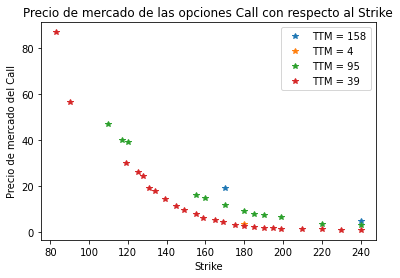

In [57]:
from matplotlib import pyplot as plt
CP = "C"
for TTM in TTMs:
    Ks = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Strike.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    plt.plot(Ks, precios,'*', label='TTM = '+str(TTM))


plt.legend()

plt.xlabel('Strike')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al Strike')
    
plt.show()
    

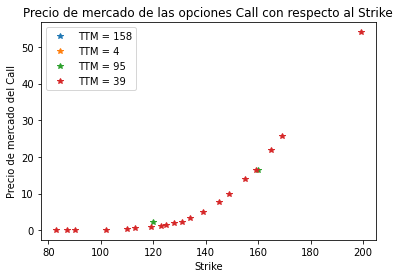

In [58]:

CP = "P"
for TTM in TTMs:
    Ks = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Strike.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.TTM == TTM) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    plt.plot(Ks, precios,'*', label='TTM = '+str(TTM))


plt.legend()

plt.xlabel('Strike')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al Strike')
    
plt.show()

In [59]:
Ks = list(set(panel_opciones_ggal_byma_limpio.Strike.values))

Ks[0:2]

[130.98, 133.98]

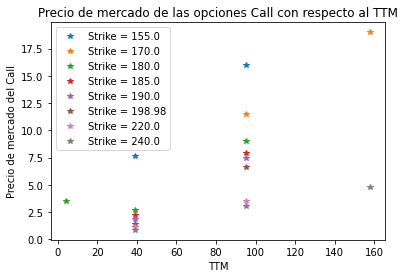

array([24.25])

In [60]:

CP = "C"
for K in Ks:
    TTMs = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].TTM.values
    precios = panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    if len(TTMs)>1:
        plt.plot(TTMs, precios,'*', label='Strike = '+str(K))

plt.legend()

plt.xlabel('TTM')
plt.ylabel('Precio de mercado del Call')
plt.title('Precio de mercado de las opciones Call con respecto al TTM')
    
plt.show()
panel_opciones_ggal_byma_limpio[(panel_opciones_ggal_byma_limpio.Strike == K) & (panel_opciones_ggal_byma_limpio.CallPut == CP)].Last.values
    